# Importing Dataset and Libraries

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import plotly.express as px

In [2]:
!pip install -U kaleido

In [3]:
df = pd.read_csv(r"C:\Users\seyda\Desktop\DataSet_Course1_MSc\Coursework1\Crime_Dataset_Coursework1-1.csv", low_memory=False)

In [4]:
df.head(5)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Prefix,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,MIDDLEBROOK,NaN,RD,08/23/2018 09:52:00 PM,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)"
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,03/30/2018 01:01:00 AM,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,03/30/2018 01:01:00 AM,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,NaN,QUINCE ORCHARD,NaN,RD,06/14/2018 10:26:00 PM,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,"(39.148, -77.2182)"
4,201204355,2204,180043926,09/03/2018 12:06:54 PM,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,NaN,FALSTONE,NaN,AVE,09/02/2018 11:30:00 PM,09/03/2018 12:30:00 AM,38.966174,-77.096561,2D,"(38.9662, -77.0966)"


# Examining and Cleaning Dataset

In [6]:
# Checking duplicates

duplicates = df.duplicated().sum()
print("Number of duplicate rows:", duplicates)

Number of duplicate rows: 0


In [7]:
# Checking missing values

missing_values = df.isna().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
Incident ID                    0
Offence Code                   0
CR Number                      0
Dispatch Date / Time       49029
NIBRS Code                     0
Victims                        0
Crime Name1                  272
Crime Name2                  272
Crime Name3                  272
Police District Name          94
Block Address              26206
City                        1276
State                          0
Zip Code                    3179
Agency                         0
Place                          0
Sector                      1530
Beat                        1530
PRA                          239
Address Number             26109
Street Prefix             292463
Street Name                    1
Street Suffix             300662
Street Type                  339
Start_Date_Time                0
End_Date_Time             161658
Latitude                       0
Longitude                      0
Police District Number         0
Location                   

In [9]:
# Checking data types

df.info()

# There are some columns that have wrong data types. They need to be converted to appropriate data types.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306094 entries, 0 to 306093
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Incident ID             306094 non-null  int64  
 1   Offence Code            306094 non-null  object 
 2   CR Number               306094 non-null  int64  
 3   Dispatch Date / Time    257065 non-null  object 
 4   NIBRS Code              306094 non-null  object 
 5   Victims                 306094 non-null  int64  
 6   Crime Name1             305822 non-null  object 
 7   Crime Name2             305822 non-null  object 
 8   Crime Name3             305822 non-null  object 
 9   Police District Name    306000 non-null  object 
 10  Block Address           279888 non-null  object 
 11  City                    304818 non-null  object 
 12  State                   306094 non-null  object 
 13  Zip Code                302915 non-null  float64
 14  Agency              

In [11]:
# Converting datatypes (Date and time data type was object, converted it to datetime data type.)

df['Dispatch Date / Time'] = pd.to_datetime(df['Dispatch Date / Time'])
df['Start_Date_Time'] = pd.to_datetime(df['Start_Date_Time'])
df['End_Date_Time'] = pd.to_datetime(df['End_Date_Time'])




C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\2493907358.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Dispatch Date / Time'] = pd.to_datetime(df['Dispatch Date / Time'])
C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\2493907358.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Start_Date_Time'] = pd.to_datetime(df['Start_Date_Time'])


In [12]:
# Creating new columns for Start and Dispatch date and time by seperating year, month, day and time based on our research questions.

df['Start_Day'] = pd.to_datetime(df["Start_Date_Time"]).dt.day.convert_dtypes()
df['Start_Month'] = pd.to_datetime(df["Start_Date_Time"]).dt.month.convert_dtypes()
df['Start_Year'] = pd.to_datetime(df["Start_Date_Time"]).dt.year.convert_dtypes()
df['Start_Time'] = pd.to_datetime(df["Start_Date_Time"]).dt.hour.convert_dtypes()

df['Dispatch_Day'] = pd.to_datetime(df["Dispatch Date / Time"]).dt.day.convert_dtypes()
df['Dispatch_Month'] = pd.to_datetime(df["Dispatch Date / Time"]).dt.month.convert_dtypes()
df['Dispatch_Year'] = pd.to_datetime(df["Dispatch Date / Time"]).dt.year.convert_dtypes()
df['Dispatch_Time'] = pd.to_datetime(df["Dispatch Date / Time"]).dt.hour.convert_dtypes()


df.head(10)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Police District Number,Location,Start_Day,Start_Month,Start_Year,Start_Time,Dispatch_Day,Dispatch_Month,Dispatch_Year,Dispatch_Time
0,201202980,3550,180042096,2018-08-23 21:52:08,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,5D,"(39.1777, -77.2656)",23,8,2018,21,23,8,2018,21
1,201181293,3522,180015424,2018-03-30 01:00:55,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,2D,"(38.9927, -77.0971)",30,3,2018,1,30,3,2018,1
2,201181293,3562,180015424,2018-03-30 01:00:55,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,2D,"(38.9927, -77.0971)",30,3,2018,1,30,3,2018,1
3,201193163,3520,180029476,2018-06-14 22:26:45,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,6D,"(39.148, -77.2182)",14,6,2018,22,14,6,2018,22
4,201204355,2204,180043926,2018-09-03 12:06:54,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,2D,"(38.9662, -77.0966)",2,9,2018,23,3,9,2018,12
5,201204355,2404,180043926,2018-09-03 12:06:54,240,1,Crime Against Property,Motor Vehicle Theft,AUTO THEFT - VEHICLE THEFT,BETHESDA,...,2D,"(38.9662, -77.0966)",2,9,2018,23,3,9,2018,12
6,201121509,5213,17008780,NaT,520,1,Crime Against Society,Weapon Law Violations,WEAPON - FIRING,WHEATON,...,4D,"(39.0889, -77.0423)",18,2,2017,0,<NA>,<NA>,<NA>,<NA>
7,201091648,1103,16038843,NaT,11A,1,Crime Against Person,Forcible Rape,RAPE - STRONG-ARM,WHEATON,...,4D,"(39.0938, -77.0764)",31,7,2016,23,<NA>,<NA>,<NA>,<NA>
8,201108886,1399,16060247,NaT,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,SILVER SPRING,...,3D,"(39.0084, -76.9856)",20,11,2016,9,<NA>,<NA>,<NA>,<NA>
9,201124327,9199,17012248,NaT,90Z,1,Other,All Other Offenses,POLICE INFORMATION,WHEATON,...,4D,"(39.0362, -77.0499)",8,3,2017,14,<NA>,<NA>,<NA>,<NA>


In [13]:
# Fill null values with 'Other' in the Crime Name Column based on the research

df["Crime Name1"] = df["Crime Name1"].fillna("Other")
df["Crime Name2"] = df["Crime Name2"].fillna("Other")
df["Crime Name3"] = df["Crime Name3"].fillna("Other")

In [14]:
# Replace State Numbers with Abbreviations

state_name  = [np.nan,'District of Columbia', 'Hawaii' ,'Idaho', 'Illinois', 'Maine', 'Maryland', 'Michigan', 'Mississippi', 'North Dakota', 'Virginia']
state_abb   = [np.nan, 'DC','HI','ID','IL','ME','MD','MC','MS','ND','VA']
state_no    = ['0','11','15','16','17','23','24','26','28','38','51']
df_states = pd.DataFrame({'State':state_name,'Abbreviation':state_abb,'No':state_no})
df_states = df_states.set_index('State')
print(df_states)

def replace_no_with_abb(no):    
    df.replace({'State' : no}, df_states.loc[df_states['No'] == no]['Abbreviation'].values[0], inplace=True)
    
replace_no_with_abb('15')
replace_no_with_abb('16')
replace_no_with_abb('17')
replace_no_with_abb('0')
print(df['State'].value_counts())

                     Abbreviation  No
State                                
NaN                           NaN   0
District of Columbia           DC  11
Hawaii                         HI  15
Idaho                          ID  16
Illinois                       IL  17
Maine                          ME  23
Maryland                       MD  24
Michigan                       MC  26
Mississippi                    MS  28
North Dakota                   ND  38
Virginia                       VA  51
State
MD    305874
ID       185
DC        22
VA         4
ME         2
MS         2
ND         1
HI         1
MC         1
IL         1
Name: count, dtype: int64


In [133]:
# Formatting the values of City column due to inconsistencies

def get_city(row):
  if row['City'] == 'BETHEDA':
    city = 'BETHESDA'
  elif row['City'] == 'CLAEKSBURG':
    city = 'CLARKSBURG'
  elif row['City'] == 'GAIHTERSBURG' or row['City'] == 'GAITHERSBUG':
    city = 'GAITHERSBURG'
  elif row['City'] == 'MT AIRY':
    city = 'MOUNT AIRY'
  elif row['City'] == 'ROCKVIILE' or row['City'] == 'ROCKVILLLE':
    city = 'ROCKVILLE'
  elif row['City'] == 'SILVERS SPRING':
    city = 'SILVER SPRING'
  elif row['City'] == 'TACOMA PARK' or row['City'] == 'CITY OF TAKOMA PARK':
    city = 'TAKOMA PARK'
  elif row['City'] == '0':
    city = 'ROCKVILLE'
  else:
    city = row['City']
  return city

df['City'] = df.apply(get_city, axis=1)
df['City'].value_counts()

City
SILVER SPRING         75974
GAITHERSBURG          32291
ROCKVILLE             30792
GERMANTOWN            21811
BETHESDA              15498
MONTGOMERY VILLAGE     6556
TAKOMA PARK            6026
POTOMAC                4753
CHEVY CHASE            4731
DERWOOD                4139
KENSINGTON             3577
OLNEY                  3293
BURTONSVILLE           2729
CLARKSBURG             2344
DAMASCUS               1868
BOYDS                  1466
BROOKEVILLE             678
POOLESVILLE             666
SANDY SPRING            305
ASHTON                  276
DICKERSON               221
CABIN JOHN              171
SPENCERVILLE             96
MOUNT AIRY               67
GLEN ECHO                60
BRINKLOW                 44
LAUREL                   35
BARNESVILLE              33
BEALLSVILLE              28
BELTSVILLE               18
WASHINGTON               18
GARRETT PARK             16
HYATTSVILLE              13
WASHINGTON GROVE          9
HIGHLAND                  8
WHEATON        

In [18]:
df = df[df["Start_Year"] >= 2018]

# Descriptive Analysis

In [23]:
# Applying descriptive statistic to numeric columns

df[['Victims', 'Dispatch_Month', 'Start_Year']].describe()

,Victims,Dispatch_Month,Start_Year
count,221565.000000,214725.0,221565.0
mean,1.023754,6.166152,2019.719969
std,0.191768,3.376128,1.350214
min,1.000000,1.0,2018.0
25%,1.000000,3.0,2019.0
50%,1.000000,6.0,2020.0
75%,1.000000,9.0,2021.0
max,12.000000,12.0,2022.0


# Visualisations based on the research questions

### Q1 : Which crime types are the highest in victim numbers?  

In [26]:
grouped_df = df.groupby(['Crime Name2', 'Crime Name3'])['Victims'].sum().reset_index()
sorted_df  = grouped_df.sort_values(['Crime Name2','Victims'], ascending=False)
top_sub_crimes = sorted_df.groupby('Crime Name2').head(5)
top_crimes = top_sub_crimes.groupby('Crime Name2')['Victims'].sum().nlargest(5).index
filtered_df = top_sub_crimes[top_sub_crimes['Crime Name2'].isin(top_crimes)]

filtered_df.head(5)

,Crime Name2,Crime Name3,Victims
307,Theft From Motor Vehicle,LARCENY - FROM AUTO,18877
296,Simple Assault,ASSAULT - 2ND DEGREE,16636
297,Simple Assault,ASSAULT - SIMPLE,3097
173,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,9788
159,Drug/Narcotic Violations,DRUGS - COCAINE - POSSESS,1264


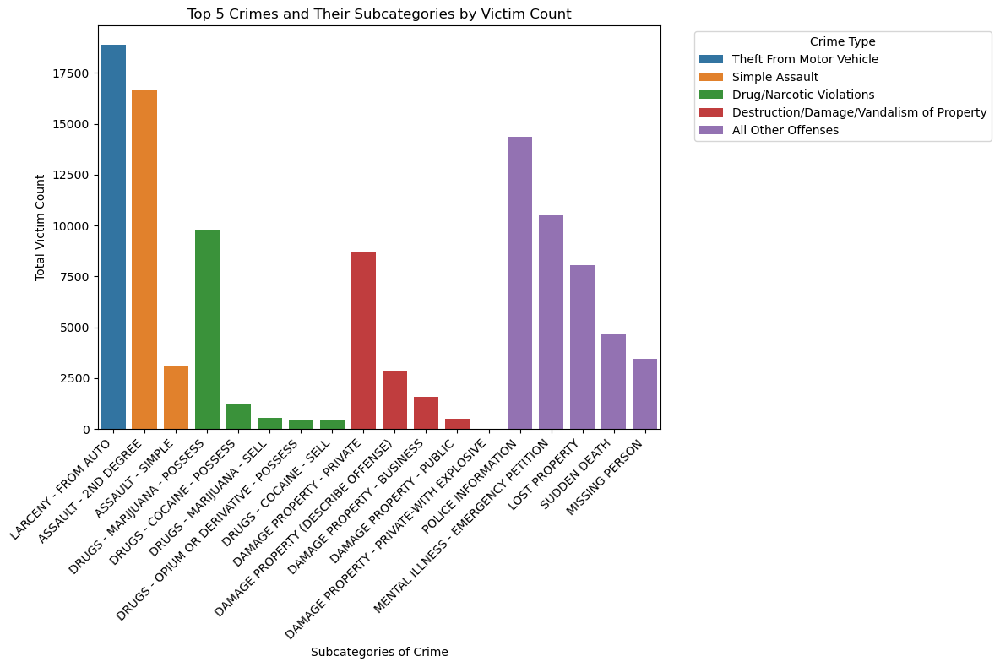

In [27]:
# Visualizing a bar chart of Crime Types by Victim Count
plt.figure(figsize=(12, 8))

# Create a bar plot with 'Crime Name3' on the x-axis and 'Victims' on the y-axis
sns.barplot(
    data=filtered_df,
    x='Crime Name3',
    y='Victims',
    hue='Crime Name2',  # Hue to differentiate primary crime types
    dodge=False  # Stack the bars for each Crime Name2 group
)

# Customize the plot
plt.title("Top 5 Crimes and Their Subcategories by Victim Count")
plt.xlabel("Subcategories of Crime")
plt.ylabel("Total Victim Count")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title="Crime Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()  # Adjust layout to fit labels and title
plt.savefig('bar_chart.png')
plt.show()

In [28]:
df_crime = df.groupby(['Start_Year', 'Crime Name2'])['Victims'].max().reset_index()
max_cat_per_year = df_crime.sort_values(['Start_Year','Victims'], ascending=False)
top_cat_per_year = max_cat_per_year.groupby('Start_Year').head(5)
top_cat_per_year

,Start_Year,Crime Name2,Victims
228,2022,All Other Offenses,12
273,2022,Simple Assault,7
227,2022,Aggravated Assault,6
247,2022,Fondling,5
248,2022,Forcible Fondling,2
169,2021,All Other Offenses,8
168,2021,Aggravated Assault,6
217,2021,Simple Assault,6
207,2021,Other,5
189,2021,Fondling,3


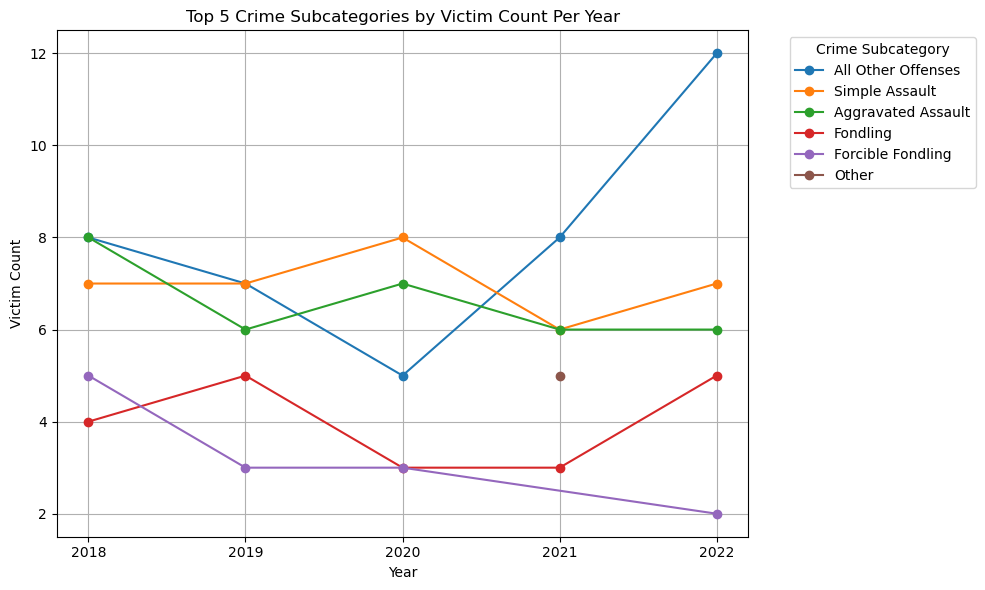

In [29]:
# Filter for top categories to ensure consistency across years
unique_categories = top_cat_per_year['Crime Name2'].unique()
filtered_df = top_cat_per_year[top_cat_per_year['Crime Name2'].isin(unique_categories)]

# Set up the plot
plt.figure(figsize=(10, 6))

# Plot each crime subcategory across years
for crime in unique_categories:
    crime_data = filtered_df[filtered_df['Crime Name2'] == crime]
    plt.plot(crime_data['Start_Year'], crime_data['Victims'], marker='o', label=crime)

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Victim Count')
plt.title('Top 5 Crime Subcategories by Victim Count Per Year')
plt.legend(title='Crime Subcategory', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(int(min(filtered_df['Start_Year'])), int(max(filtered_df['Start_Year'])) + 1))
plt.grid(True)
plt.tight_layout()

plt.savefig('line_chart.png')
plt.show()

### Q2: What is the crime number pattern over the year?

In [31]:
# Let's create the copied version of the cleaned dataset for further investigation based on the research questions.
df2 = df
crime_per_year = df2['Start_Year'].value_counts().sort_index()
crime_per_year

Start_Year
2018    54334
2019    51456
2020    44912
2021    43647
2022    27216
Name: count, dtype: Int64

C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\2439015250.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=crime_per_year.index, y=crime_per_year.values, palette="viridis")


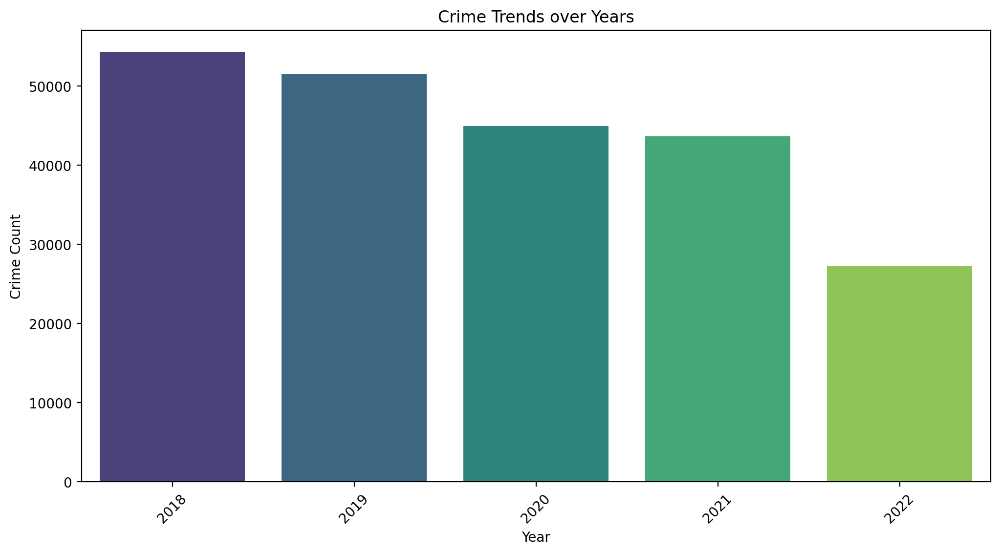

<Figure size 640x480 with 0 Axes>

In [32]:
# Creating a bar chart

plt.figure(figsize=(12, 6), dpi =200)
sns.barplot(x=crime_per_year.index, y=crime_per_year.values, palette="viridis")
plt.title("Crime Trends over Years")
plt.xlabel("Year")
plt.ylabel("Crime Count")
plt.xticks(rotation=45)
plt.show()
plt.savefig('Number_of_Crime_per_year.png')

C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\4262129752.py:6: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=crime_monthly2, x='Start_Month', y='Crime Count', palette='coolwarm')


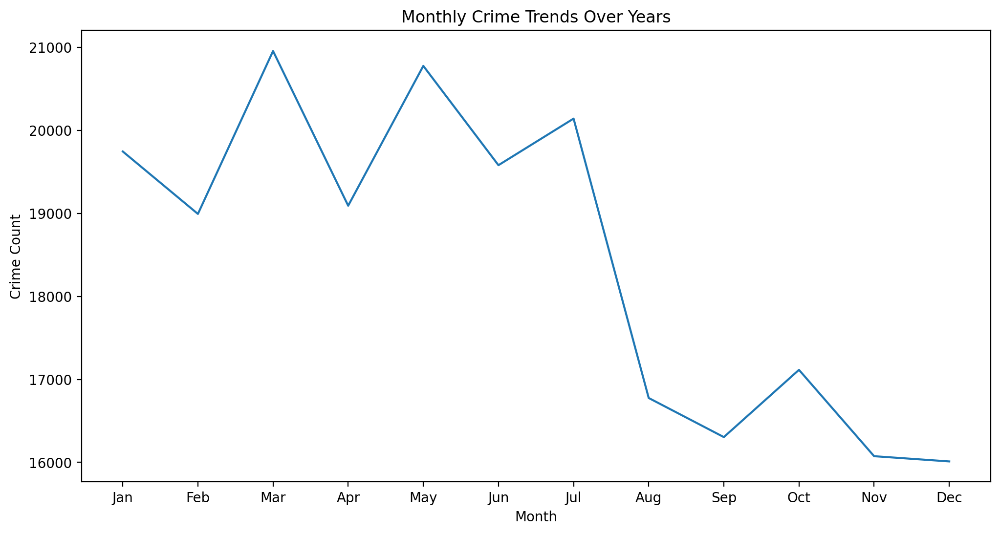

In [33]:
# Creating a line chart based on monthly pattern

crime_monthly2= df2.groupby(['Start_Month']).size().reset_index(name='Crime Count')

plt.figure(figsize=(12, 6), dpi =200)
sns.lineplot(data=crime_monthly2, x='Start_Month', y='Crime Count', palette='coolwarm')
plt.title('Monthly Crime Trends Over Years')
plt.xlabel('Month')
plt.ylabel('Crime Count')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


### Q3: What types of crime show the most meaningful change over the time?

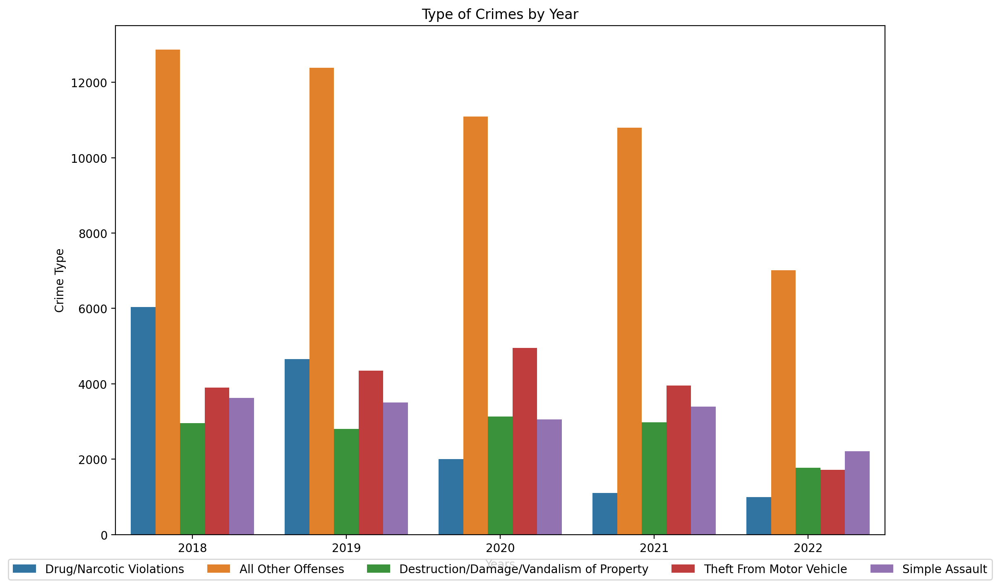

In [35]:
# Have the largest 5 crime types for this investigation
# Bar chart for crime types change over the time

top_crime_names = df2['Crime Name2'].value_counts().nlargest(5).index

filtered_data = df2[df2['Crime Name2'].isin(top_crime_names)]
plt.figure(figsize=(12, 8), dpi=200)
sns.countplot(data=filtered_data, x = 'Start_Year', hue = 'Crime Name2' )
plt.xlabel('Years')
plt.ylabel('Crime Type')
plt.title('Type of Crimes by Year')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol = len('Crime Name2'))


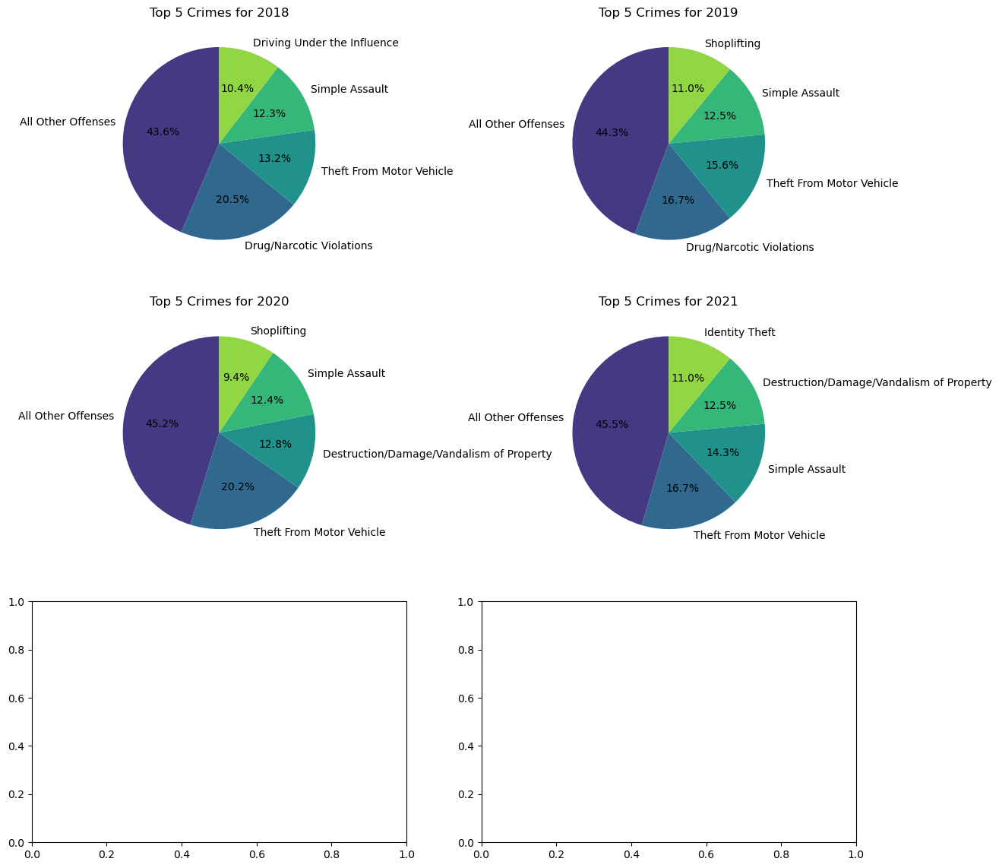

In [36]:
# Pie chart for this research

fig, axes = plt.subplots(3, 2, figsize=(14, 14))

for idx, i in enumerate(range(2018, 2022)):
    supset1 = df2[df2['Start_Year'] == i]
    supset2 = supset1['Crime Name2'].value_counts().nlargest(5)
    
    ax = axes[idx // 2, idx % 2]
    
    ax.pie(supset2, labels=supset2.index, autopct='%1.1f%%', startangle=90, 
           colors=sns.color_palette('viridis', len(supset2)))
    ax.set_title(f'Top 5 Crimes for {i}')
    
plt.savefig('Type_of_crimes_per_year2.png')

### Q4: How does the distribution of crime vary depending on the time of day? 

In [38]:
# Creating a new column to define time periods (e.g., Morning, Afternoon, Evening, Night)

time_bins = [0, 6, 12, 18, 24]
time_labels = ['Night (12 AM - 6 AM)', 'Morning (6 AM - 12 PM)', 'Afternoon (12 PM - 6 PM)', 'Evening (6 PM - 12 AM)']
df2['Time of Day'] = pd.cut(df2['Start_Time'], bins=time_bins, labels=time_labels, right=False)
df2.head(5)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Location,Start_Day,Start_Month,Start_Year,Start_Time,Dispatch_Day,Dispatch_Month,Dispatch_Year,Dispatch_Time,Time of Day
0,201202980,3550,180042096,2018-08-23 21:52:08,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,"(39.1777, -77.2656)",23,8,2018,21,23,8,2018,21,Evening (6 PM - 12 AM)
1,201181293,3522,180015424,2018-03-30 01:00:55,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,"(38.9927, -77.0971)",30,3,2018,1,30,3,2018,1,Night (12 AM - 6 AM)
2,201181293,3562,180015424,2018-03-30 01:00:55,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,"(38.9927, -77.0971)",30,3,2018,1,30,3,2018,1,Night (12 AM - 6 AM)
3,201193163,3520,180029476,2018-06-14 22:26:45,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,"(39.148, -77.2182)",14,6,2018,22,14,6,2018,22,Evening (6 PM - 12 AM)
4,201204355,2204,180043926,2018-09-03 12:06:54,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,"(38.9662, -77.0966)",2,9,2018,23,3,9,2018,12,Evening (6 PM - 12 AM)


In [39]:
# Count the number of crimes in each time of day category

time_of_day_counts = df2['Time of Day'].value_counts().sort_index()

# Creating a data frame for time_of_day_counts

time_of_day_df = pd.DataFrame({'Time of Day': time_of_day_counts.index, 'Crime Count': time_of_day_counts.values})
time_of_day_df

,Time of Day,Crime Count
0,Night (12 AM - 6 AM),37557
1,Morning (6 AM - 12 PM),39670
2,Afternoon (12 PM - 6 PM),74666
3,Evening (6 PM - 12 AM),69672


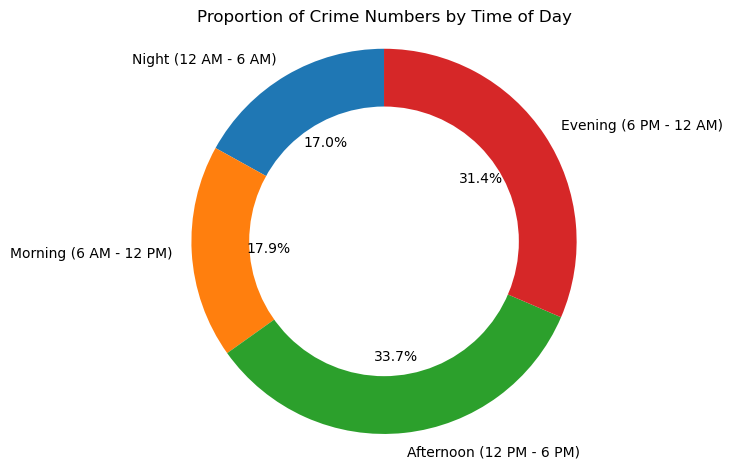

In [40]:
# Creating a circle pie chart

fig1, ax1 = plt.subplots()
ax1.pie(time_of_day_counts, labels=time_of_day_counts.index, autopct='%1.1f%%', startangle=90)

#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.title('Proportion of Crime Numbers by Time of Day')
plt.tight_layout()
plt.show()

C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\2032906579.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Time of Day', y='Start_Time', data=df2, palette='viridis')


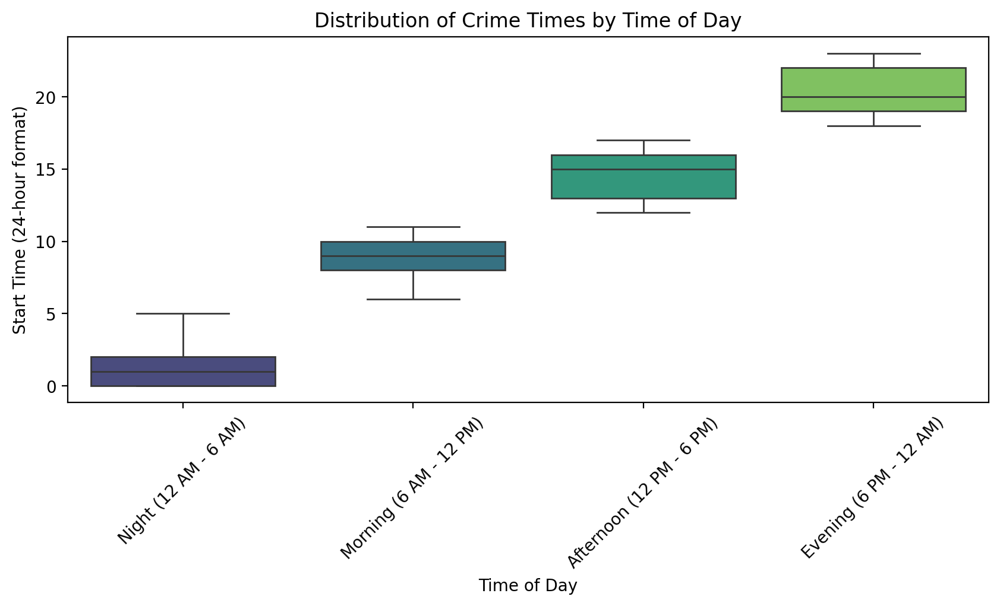

In [41]:
# Creating boxplot 

plt.figure(figsize=(10, 4), dpi = 200)
sns.boxplot(x='Time of Day', y='Start_Time', data=df2, palette='viridis')
plt.title('Distribution of Crime Times by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Start Time (24-hour format)')
plt.xticks(rotation=45)
plt.show()

### Q5: How is the crime distributed according to the Crime Name 1 along the Police District Numbers and the cities? 

In [43]:
df['Police District Number'].replace({'1.0D': '1D', '3.0D': '3D', '4.0D': '4D', '5.0D': '5D', '6.0D': '6D', '8.0D': '8D'}, inplace=True)


C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\875933433.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Police District Number'].replace({'1.0D': '1D', '3.0D': '3D', '4.0D': '4D', '5.0D': '5D', '6.0D': '6D', '8.0D': '8D'}, inplace=True)


<Figure size 14400x10800 with 0 Axes>

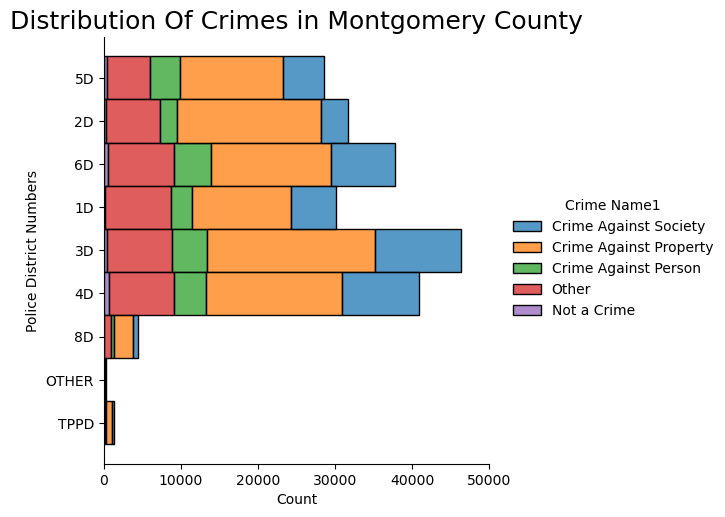

In [44]:
plt.figure(figsize=(16,12), dpi=900)
stackbar1= sns.displot(data=df, y='Police District Number', hue='Crime Name1', multiple='stack')
stackbar1.set_xticklabels()
stackbar1.set(ylabel='Police District Numbers')
plt.title("Distribution Of Crimes in Montgomery County",fontsize= 18);

In [45]:
# Relationship between crime types and city

plt.figure(figsize=(12,8), dpi=900)
histp=sns.countplot(x='City', hue='Crime Name1', data=df, dodge = False)
plt.legend(loc='upper right', title='Crime Name1')
histp.set_xticklabels(histp.get_xticklabels(), rotation=90)
plt.title("Relationship between type of crime and city",fontsize= 16);

C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\3024197319.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  histp.set_xticklabels(histp.get_xticklabels(), rotation=90)


### Q6: What substance and what type of misuse are the commonest in the “Drug/Narcotic Violations” crimes?


In [47]:
# Create a dataset with "Crime Name2" containing "Drug/Narcotic Violations" without empty values and missing "Crime Name3"
df_drug = df[df["Crime Name2"].str.contains("Drug/Narcotic Violations", na=False) & df["Crime Name3"].notna()]

#Create 2 different columns for 'Substance' and 'Misuse'
# Use .str.extract() with regex to capture the text between two dashes
df_drug["Substance"] = df["Crime Name3"].str.extract(r"-\s*([^-]+?)\s*-")
df_drug["Misuse"] = df["Crime Name3"].str.extract(r"-\s*([^-]+)$")


C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\1086005204.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_drug["Substance"] = df["Crime Name3"].str.extract(r"-\s*([^-]+?)\s*-")
C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\1086005204.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_drug["Misuse"] = df["Crime Name3"].str.extract(r"-\s*([^-]+)$")


<Axes: xlabel='Substance', ylabel='count'>

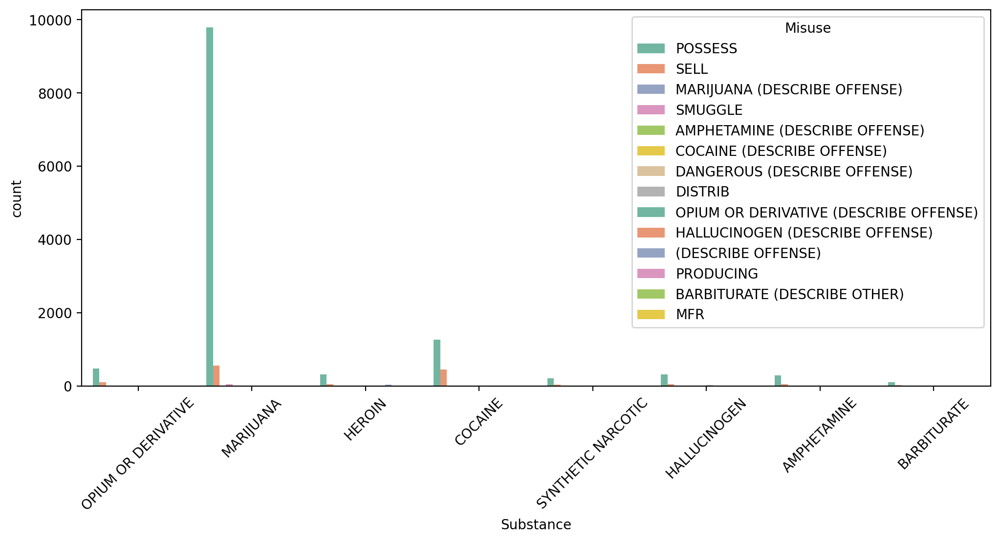

In [48]:
# Bar chart 
plt.figure(figsize=(12,5), dpi=200)
plt.xticks(rotation=45)
sns.countplot(data=df_drug, x="Substance", hue="Misuse", palette="Set2")

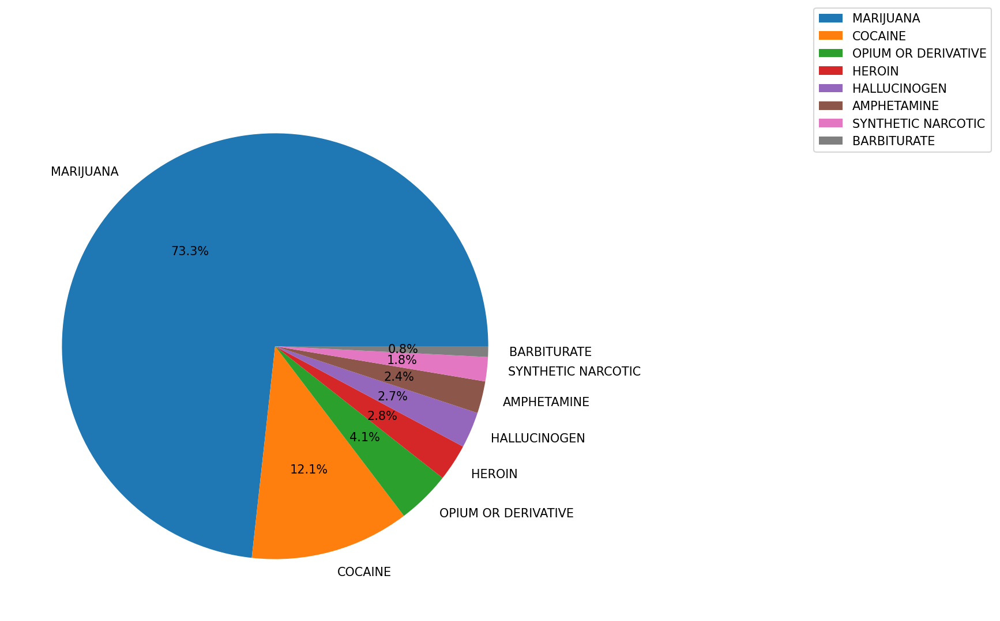

In [49]:
# Pie chart

plt.figure(figsize=(10,8), dpi=150)
plt.pie(x=df_drug["Substance"].value_counts(), labels=df_drug["Substance"].value_counts().index, autopct='%.1f%%');
plt.legend(df_drug["Substance"].value_counts().index, loc="center left", bbox_to_anchor=(1.5, 1)  )

### Q7: Which places are more prone to which types of crimes?

In [ ]:
top_5_places_df = df['Place'].value_counts().nlargest(5)

# Reset index to convert 'Place' into column
top_5_places_df = top_5_places_df.reset_index()
# Rename columns for clarity
top_5_places_df.columns = ['Place', 'count']

# Create Tree Map with Plotly
fig = px.treemap(
    top_5_places_df,
    path=['Place'],
    values='count',
    color='count',
    color_continuous_scale='RdYlGn_r',
    title="Top 5 Places for Reported Crimes"
)

# Show the tree map
fig.write_image('tree_chart.png')
fig.show()


In [51]:
#victim impact of different places

places_df = df.groupby(['Place', 'Crime Name2'])['Victims'].sum().reset_index()
sorted_places_df  = places_df.sort_values(['Place','Victims'], ascending=False)
top_places = sorted_places_df.groupby('Place').head(5)
top_crimes = top_places.groupby('Place')['Victims'].sum().nlargest(5).index
fil_df = top_places[top_places['Place'].isin(top_crimes)]


<Figure size 1400x800 with 0 Axes>

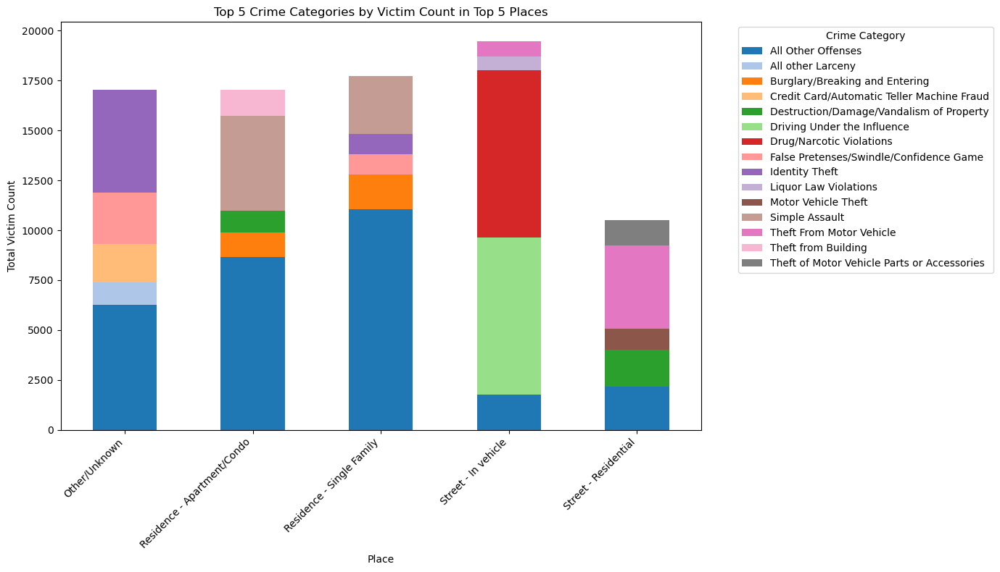

In [52]:
# Set the plot size
plt.figure(figsize=(14, 8))

# Create a stacked bar chart
# Set up the distinct color palette
colors = sns.color_palette("tab20", 20) + sns.color_palette("Set2", 20)

# Pivot the data to create a stacked structure where each crime subcategory is a separate column
pivot_df = fil_df.pivot(index='Place', columns='Crime Name2', values='Victims').fillna(0)

# Plot the stacked bar chart
pivot_df.plot(
    kind='bar',
    stacked=True,
    color=colors,  # Use a color map for differentiation
    figsize=(14, 8)
)

# Customize the plot
plt.title("Top 5 Crime Categories by Victim Count in Top 5 Places")
plt.xlabel("Place")
plt.ylabel("Total Victim Count")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.legend(title="Crime Category", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.savefig('stacked_bar_chart.png')
plt.show()

### Q8: How are vehicle related crimes connected to the street types?

In [53]:
# Create a dataset with "Crime Name2" containing "Vehicle" without empty values and missing Street Type
df_street = df[df["Crime Name2"].str.contains("Vehicle", na=False) & df["Street Type"].notna()]


<Axes: xlabel='Street Type', ylabel='probability'>

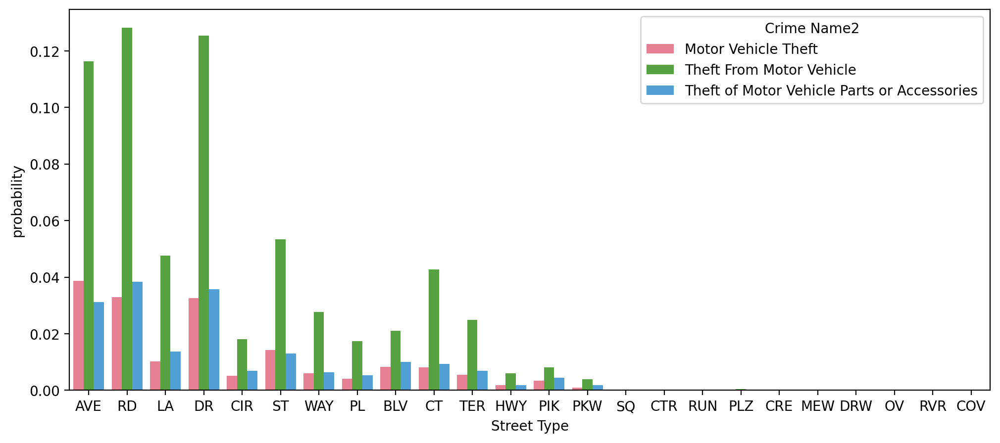

In [54]:
# Bar chart
plt.figure(figsize=(12,5), dpi=200)
sns.countplot(data=df_street, x="Street Type", hue="Crime Name2", palette="husl", stat="probability")

<Axes: ylabel='Street Type'>

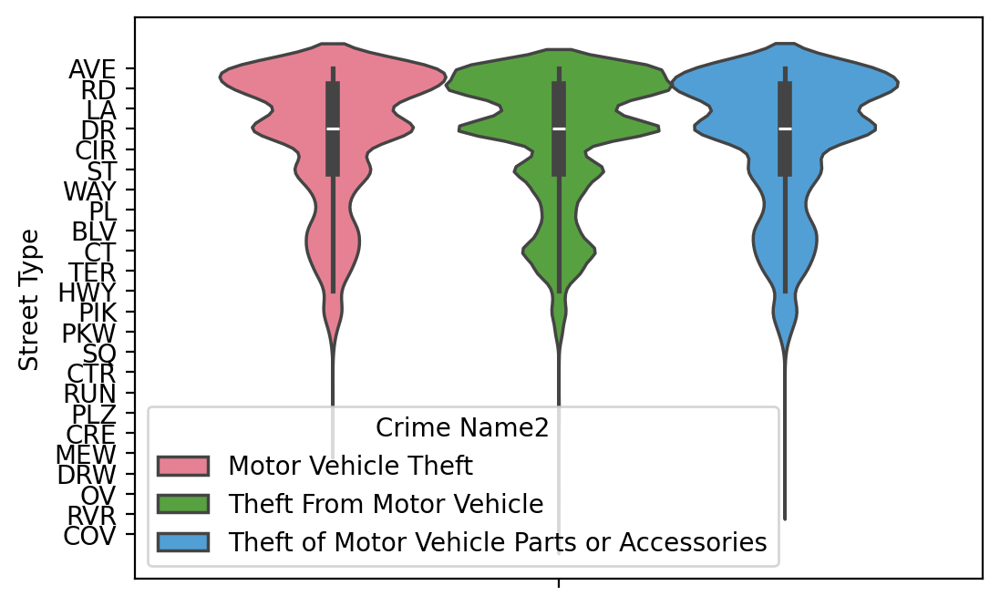

In [55]:
# Violin plot

plt.figure(figsize=(6,4), dpi=200)
sns.violinplot(data=df_street, y="Street Type", hue="Crime Name2", palette = "husl")

### Q9: What geographic areas show the highest crime rate? 

In [57]:
#As the number of crimes (3) are too high , lets find the 5 most occured crimes 
df_cleaned = df[(df != 0).all(axis=1)]

df_top5= df_cleaned['Crime Name3'].value_counts().head(5)
#By using .index.tolist() method we can have a list of the the 5 most occured crimes 
df_top5 = df_top5.index.tolist()
#lets find wich records are included in this list regarding the 5 most occured crimes 
df_highc1 = df_cleaned.loc[df['Crime Name3'].isin (df_top5)]
df_highc1 

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Location,Start_Day,Start_Month,Start_Year,Start_Time,Dispatch_Day,Dispatch_Month,Dispatch_Year,Dispatch_Time,Time of Day
17,201182797,9199,180017333,2018-04-09 23:36:51,90Z,1,Other,All Other Offenses,POLICE INFORMATION,SILVER SPRING,...,"(39.0456, -76.9919)",9,4,2018,17,9,4,2018,23,Afternoon (12 PM - 6 PM)
22,201212791,9113,180052875,2018-10-22 12:33:32,90Z,1,Other,All Other Offenses,MENTAL ILLNESS - EMERGENCY PETITION,SILVER SPRING,...,"(39.0553, -76.9956)",22,10,2018,9,22,10,2018,12,Morning (6 AM - 12 PM)
26,201195752,9113,180033224,2018-07-05 19:50:57,90Z,1,Other,All Other Offenses,MENTAL ILLNESS - EMERGENCY PETITION,ROCKVILLE,...,"(39.0821, -77.2391)",5,7,2018,19,5,7,2018,19,Evening (6 PM - 12 AM)
50,201277830,2303,200007619,2020-02-14 21:10:52,23C,1,Crime Against Property,Shoplifting,LARCENY - SHOPLIFTING,BETHESDA,...,"(39.0221, -77.1474)",14,2,2020,20,14,2,2020,21,Evening (6 PM - 12 AM)
54,201346569,9113,210037794,2021-09-24 12:12:58,90Z,1,Other,All Other Offenses,MENTAL ILLNESS - EMERGENCY PETITION,SILVER SPRING,...,"(39.0864, -76.9357)",24,9,2021,12,24,9,2021,12,Afternoon (12 PM - 6 PM)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306079,201329031,2303,210015927,2021-04-29 05:37:02,23C,1,Crime Against Property,Shoplifting,LARCENY - SHOPLIFTING,ROCKVILLE,...,"(39.08, -77.1434)",29,4,2021,5,29,4,2021,5,Night (12 AM - 6 AM)
306083,201321181,2303,210007370,2021-02-26 12:11:12,23C,1,Crime Against Property,Shoplifting,LARCENY - SHOPLIFTING,WHEATON,...,"(39.0374, -77.0517)",26,2,2021,12,26,2,2021,12,Afternoon (12 PM - 6 PM)
306089,201320571,1399,210006666,2021-02-21 07:25:28,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,MONTGOMERY VILLAGE,...,"(39.1727, -77.1973)",20,2,2021,20,21,2,2021,7,Evening (6 PM - 12 AM)
306090,201329875,2305,210017101,2021-05-06 22:54:47,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,WHEATON,...,"(39.0597, -77.076)",6,5,2021,3,6,5,2021,22,Night (12 AM - 6 AM)


<Axes: xlabel='Latitude', ylabel='Longitude'>

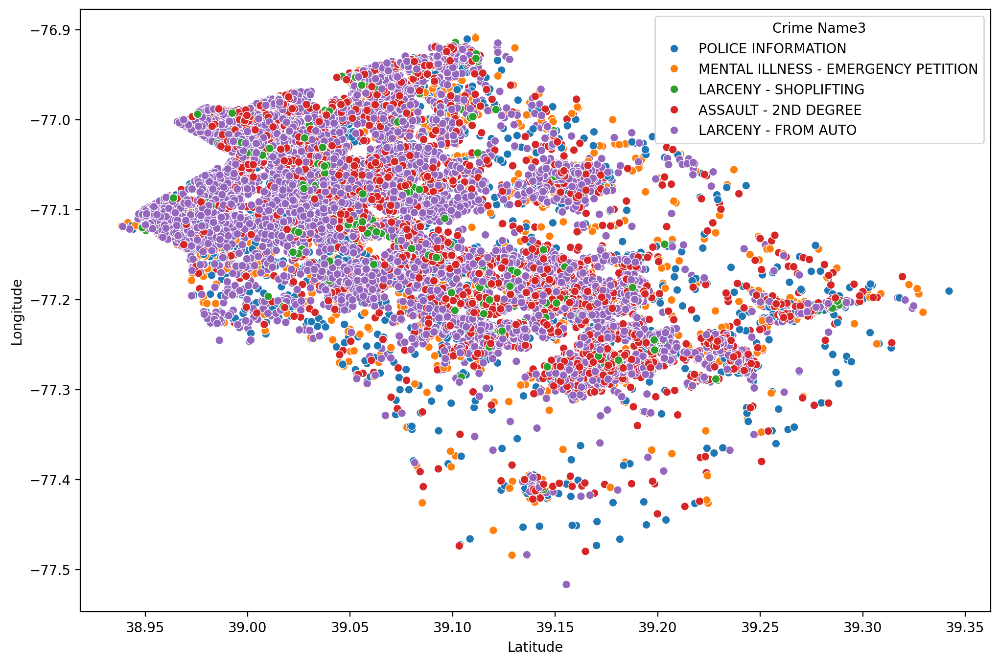

In [58]:
plt.figure(figsize=(12,8), dpi=200)
sns.scatterplot(x='Latitude', y='Longitude', data=df_highc1, hue= 'Crime Name3')


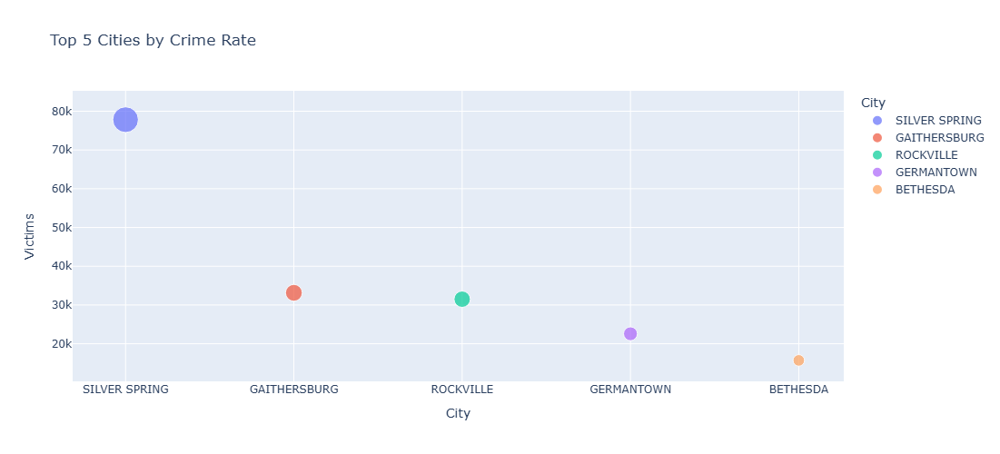

In [59]:
places_df = df.groupby(['City'])['Victims'].sum().reset_index()
top_5_cities = places_df.sort_values(by='Victims', ascending=False).head(5)
fig = px.scatter(top_5_cities, x='City', y='Victims', size='Victims', color = 'City', width=800, height=500, title='Top 5 Cities by Crime Rate')

fig.show()

### Q10: What is the average response time for each police district?

In [149]:
df_response = df

def get_district(row):
  if row['Police District Name'] == 'TACOMA PARK' or row['Police District Name'] == 'CITY OF TAKOMA PARK':
    city = 'TAKOMA PARK'
  else:
    city = row['Police District Name']
  return city
    
df_response['Police District Name'] = df_response.apply(get_district, axis=1)


C:\Users\seyda\AppData\Local\Temp\ipykernel_16696\471292998.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




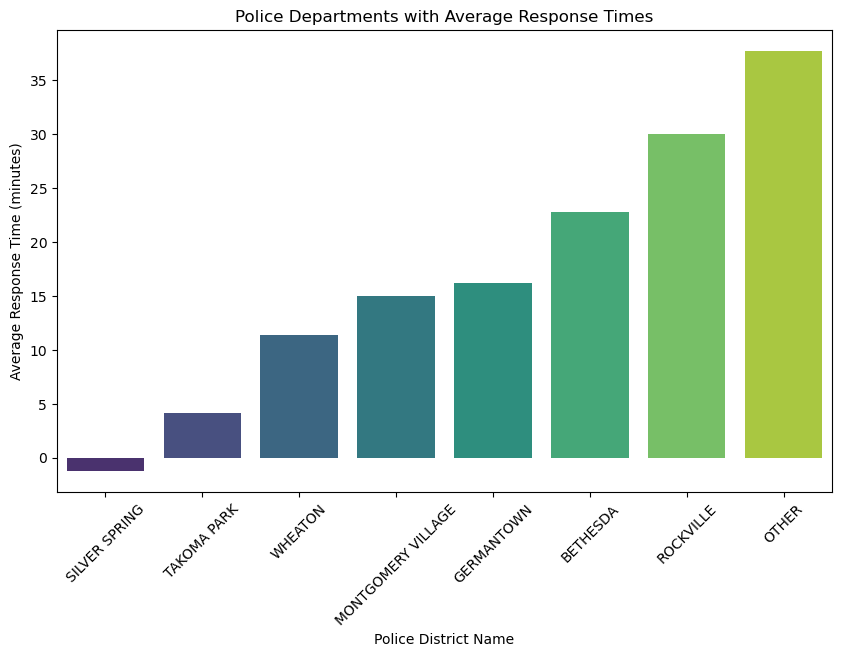

In [189]:
df_response['Police District Name'] = df_response.apply(get_district, axis=1)

# Calculate the response time
df_response['Response_Time'] = (df_response['Dispatch_Time'] - df_response['Start_Time'])*60

avg_response_time = df_response.groupby('Police District Name')['Response_Time'].mean().reset_index()
 
# 2. Sort by the response time in ascending order
avg_response_time = avg_response_time.sort_values(by='Response_Time')
 
# 3. Select the top N police departments with the shortest response times (for example, top 10)
top_districts = avg_response_time.head(10)
 
# 4. Plotting the data using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=top_districts, x='Police District Name', y='Response_Time', palette='viridis')
plt.title('Police Departments with Average Response Times')
plt.xlabel('Police District Name')
plt.ylabel('Average Response Time (minutes)')
plt.xticks(rotation=45)
plt.show()

In [153]:
pip install wordcloud matplotlib




SyntaxError: invalid syntax (801098979.py, line 1)

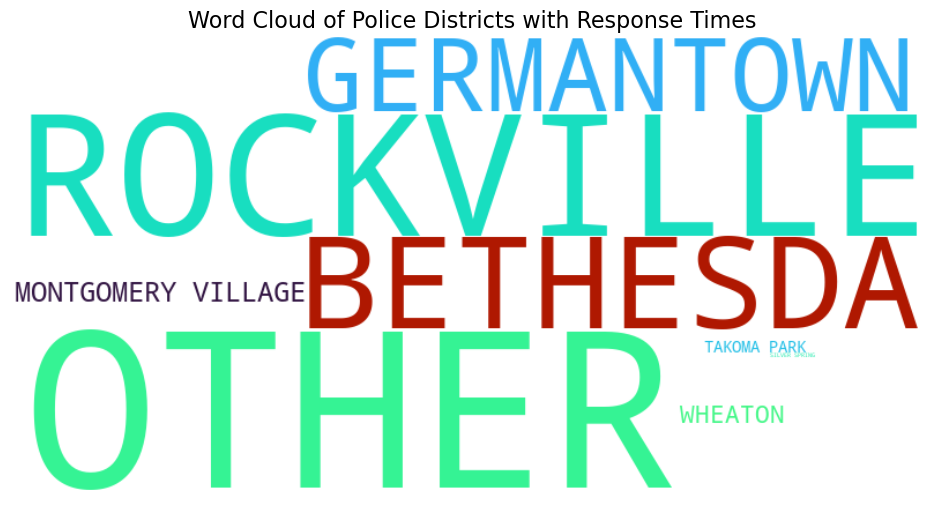

In [195]:
from wordcloud import WordCloud

avg_response_time = df_response.groupby('Police District Name')['Response_Time'].mean().reset_index()

# Sort by response time in ascending order
avg_response_time = avg_response_time.sort_values(by='Response_Time')

# Select the top N districts with the shortest response times
districts = avg_response_time

# Create a dictionary of police districts and their average response times
wordcloud_data = dict(zip(districts['Police District Name'], districts['Response_Time']))

def random_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "rgb({},{},{})".format(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    
# Generate the word cloud
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='turbo',
    prefer_horizontal=1.0
).generate_from_frequencies(wordcloud_data)

# Display the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Word Cloud of Police Districts with Response Times', fontsize=16)
plt.show()

### Q10: What type of crime frequently occurs in different geographic areas? 

<Axes: xlabel='Latitude', ylabel='Longitude'>

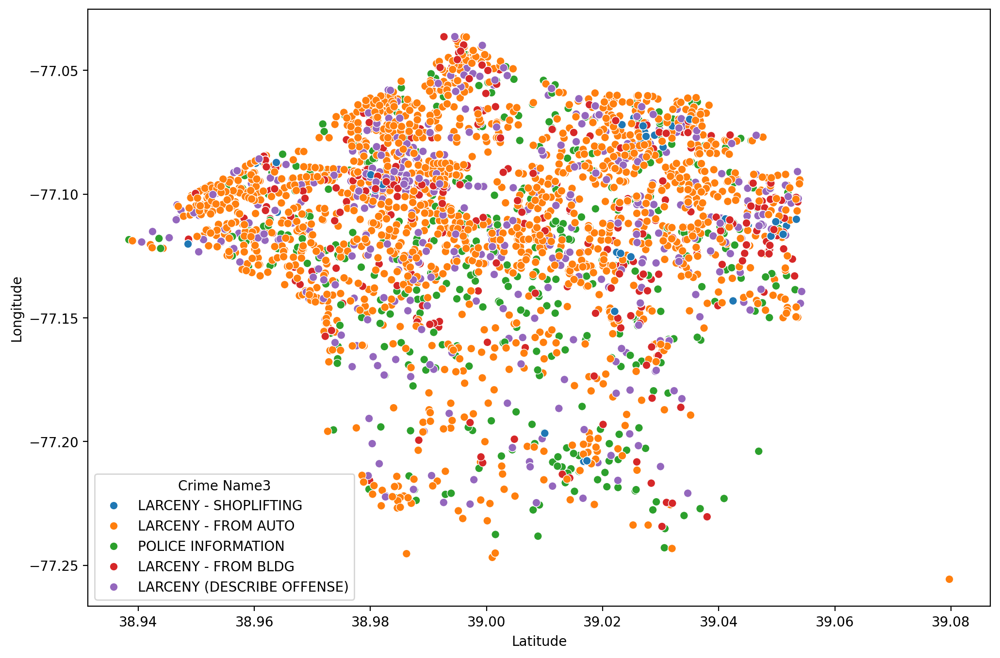

In [101]:
df_2D = df_cleaned[df_cleaned['Police District Number'] == '2D']
df_2D

df_top5= df_2D['Crime Name3'].value_counts().head(5)
#By using .index.tolist() method we can have a list of the the 5 most occured crimes 
df_top5 = df_top5.index.tolist()
#lets find wich records are included in this list regarding the 5 most occured crimes 
df_highc1 = df_2D.loc[df_cleaned['Crime Name3'].isin (df_top5)]
df_highc1 

plt.figure(figsize=(12,8), dpi=200)
sns.scatterplot(x='Latitude', y='Longitude', data=df_highc1 , hue= 'Crime Name3')


<Axes: xlabel='Latitude', ylabel='Longitude'>

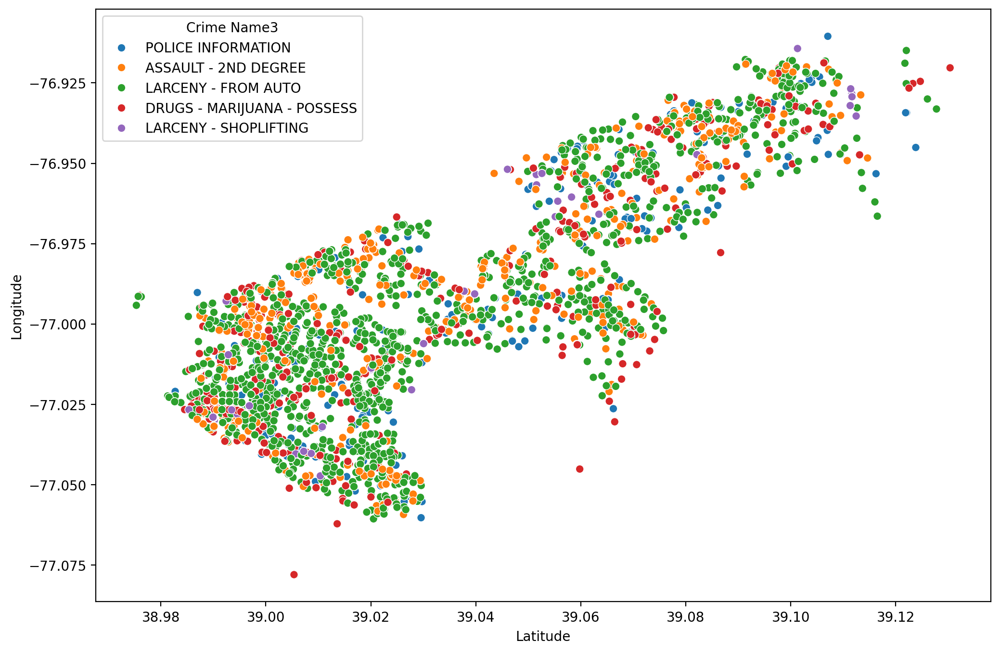

In [102]:
df_3D = df_cleaned[df_cleaned['Police District Number'] == '3D']
df_3D

df_top51= df_3D['Crime Name3'].value_counts().head(5)
#By using .index.tolist() method we can have a list of the the 5 most occured crimes 
df_top51 = df_top51.index.tolist()
#lets find wich records are included in this list regarding the 5 most occured crimes 
df_highc2 = df_3D.loc[df_cleaned['Crime Name3'].isin (df_top51)]
df_highc2 

plt.figure(figsize=(12,8), dpi=200)
sns.scatterplot(x='Latitude', y='Longitude', data=df_highc2 , hue= 'Crime Name3')